In [1]:
from skimage.io import imread_collection
import cv2
import numpy as np
from keras.utils import np_utils 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split



def load_data(path):
    #creating a collection with the available images
    image = imread_collection(path)
    image_set = []
    for n in image:
        n = cv2.cvtColor(n,cv2.COLOR_RGB2GRAY)
        image_set.append(n)
    return image_set

Using TensorFlow backend.


In [ ]:
data_set = load_data('original/*.jpg')
#valid_set = load(data'valid/*.jpg')

In [ ]:
def process_image(image_set, size, margin):
    data = []
    for n in image_set:
        n = n[margin[0]:margin[1], margin[2]:margin[3]]
        n = cv2.resize(n,(size,size))
        n = n / 255
        data.append(n)
    return data
    
def set_init(dataset, train_set_ratio, valid_set_ratio, test_set_ratio):

    
    #creating label set for all images
    label = np.empty(195*4)
    for i in range(195):
        label[i*4:i*4+4] = i
    label = label.astype(np.int)
    print(label.shape)
    label = np_utils.to_categorical(label, 195)#transfer to one-hot matrix
    
    train_num = 780*train_set_ratio
    train_num = int(train_num)
    valid_num = 780*valid_set_ratio
    valid_num = int(valid_num)
    test_num = 780*test_set_ratio
    test_num = int(test_num)
    
    train_data = np.empty((train_num,200,200))  
    train_label = np.empty((train_num,195))   
    valid_data = np.empty((valid_num, 200,200))   
    valid_label = np.empty((valid_num,195))   
    test_data = np.empty((test_num,200,200))  
    test_label = np.empty((test_num,195)) 
    
    x_test_tot = np.empty((valid_num + test_num,200,200))
    y_test_tot = np.empty((valid_num + test_num,195))
    
    train_data, x_test_tot, train_label, y_test_tot = train_test_split(dataset, label, test_size = 1-train_set_ratio)
    
    valid_data, test_data, valid_label, test_label = train_test_split(x_test_tot, y_test_tot, test_size = test_set_ratio/(valid_set_ratio + test_set_ratio))
    
    train_data = np.asarray(train_data)
    x_test_tot = np.asarray(x_test_tot);
    valid_data = np.asarray(valid_data)
    test_data = np.asarray(test_data)
#     for i in range(195):
#         train_data[i * 2:i * 2 + 2] = image_set[i * 4:i * 4 + 2]
#         train_label[i * 2:i * 2 + 2] = label[i * 4:i * 4 + 2]
#         valid_data[i] = image_set[i * 4 + 2]
#         valid_label[i] = label[i * 4 + 2]
#         test_data[i] = image_set[i * 4 + 3]
#         test_label[i] = label[i * 4 + 3]
    result = [(train_data, train_label), (valid_data, valid_label),(test_data, test_label)]
#    result = [(train_data, train_label), (valid_data, valid_label)]
    return result

In [ ]:
data = process_image(data_set, size = 200, margin = [500,2500,500,3500])
data = set_init(data, train_set_ratio = 0.6, valid_set_ratio = 0.2, test_set_ratio = 0.2)


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Dropout
from keras.layers import Conv2D, MaxPooling2D,AveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from keras import regularizers
from keras.utils import generic_utils

def train(data, batch_size, epochs, nb_filters, pool_size, kernel_size):
    np.random.seed(1337)  # for reproducibility
    img_rows, img_cols = 200, 200 # Enter the width and height of the image sample
    nb_classes = 195  # number of categories
    input_shape = (img_rows, img_cols,1)  # Input image dimensions

    [(X_train, Y_train), (X_valid, Y_valid),(X_test, Y_test)] = data
   # [(X_train, Y_train), (X_valid, Y_valid)] = data
    X_train = X_train[:,:,:,np.newaxis]  
    X_valid=X_valid[:,:,:,np.newaxis]  
    X_test=X_test[:,:,:,np.newaxis]  
    print('Dimensions of the sample dataset:', X_train.shape,Y_train.shape)
    print('Dimensions of the test dataset:', X_test.shape,Y_test.shape)
    model = Sequential()
    model.add(Conv2D(32,kernel_size,padding = 'same', input_shape=input_shape,strides=1))  
    model.add(Activation('relu'))  
    model.add(AveragePooling2D(pool_size,strides=2))  
    model.add(Flatten())  
    model.add(Dense(nb_classes)) 
    model.add(Activation('softmax'))  
    model.summary()


   
    model.compile(loss='categorical_crossentropy',optimizer='adadelta',metrics=['accuracy'])
   
    

    datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    samplewise_center=True,
    samplewise_std_normalization=True
    )
    valid_gen = datagen.flow(X_valid, Y_valid,batch_size=30)
    datagen.fit(X_train)
#     print(X_train[0].shape)
    
#    for X_batch, y_batch in datagen.flow(X_train, Y_train, batch_size=9):
#    # Show 9 images
#        for i in range(0, 9):
#            X = np.squeeze(X_batch[i],axis=2)
#            print(X_batch[i].shape)
#            plt.imshow(X,cmap='gray')
#    # show the plot
#            plt.show()
    model.fit_generator(datagen.flow(X_train, Y_train, batch_size=20),
                    steps_per_epoch = 50, epochs=60
                        , verbose=1,validation_data = (X_valid,Y_valid),validation_steps = 50)

    
    
    score = model.evaluate(X_test, Y_test, verbose=0)
    print('Test score:', score[0])
    print('Test accuracy:', score[1])
    
    y_train_out = model.predict(X_train)
    y_train_out = y_train_out.argmax(axis=1)
    for i in range(len(y_train_out)):
    #     oneimg = X_test[i,:,:,0]*256
    #     im = Image.fromarray(oneimg)
    #     im.show()
        print('train: Person %d identified as person %d'%(Y_train.argmax(axis=1).item(i),y_train_out[i]))
        
    print(len(X_train))
    X_opt = X_train[0:1:1]
#     print(X_opt)
   # X_opt = X_opt[:,:,:,np.newaxis]
#    y_opt = model.predict(X_opt)
#    y_opt = y_opt.argmax(axis=1)
#    print(y_opt)
    y_pred = model.predict(X_test)
    y_pred = y_pred.argmax(axis=1)   
    for i in range(len(y_pred)):
#     #     oneimg = X_test[i,:,:,0]*256
#     #     im = Image.fromarray(oneimg)
#     #     im.show()
        print('Person %d identified as person %d'%(Y_test.argmax(axis=1).item(i),y_pred[i]))

In [ ]:
train(data, batch_size = 20,epochs = 15, nb_filters = 64, pool_size = 2, kernel_size = 3)

(200, 200)


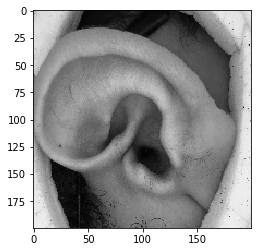

(200, 200)


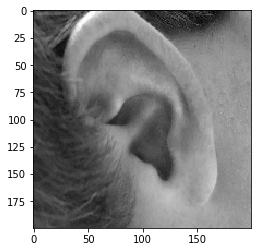

(200, 200)


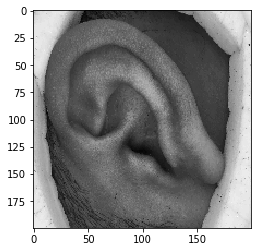

(200, 200)


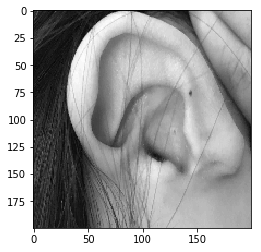

(200, 200)


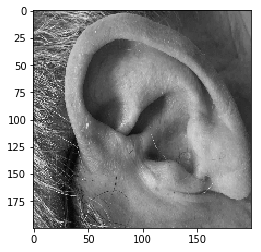

(200, 200)


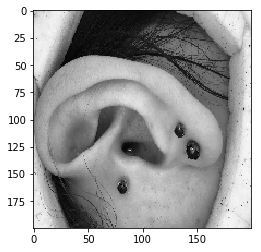

(200, 200)


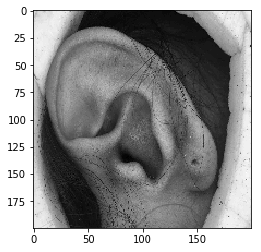

(200, 200)


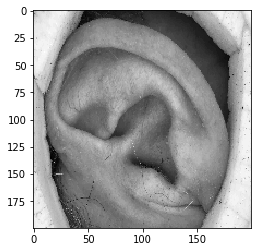

(200, 200)


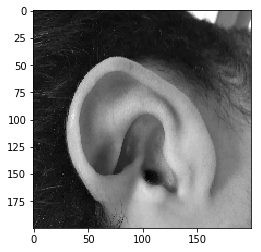

(200, 200)


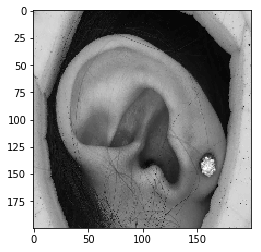

(200, 200)


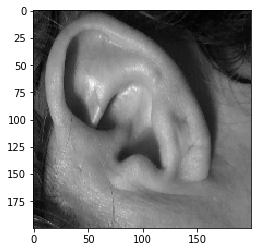

(200, 200)


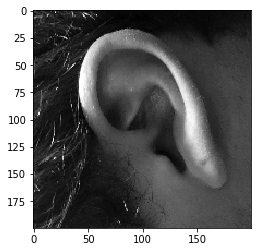

(200, 200)


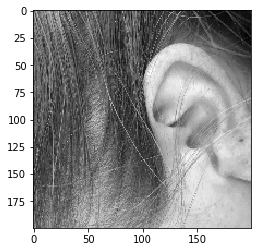

(200, 200)


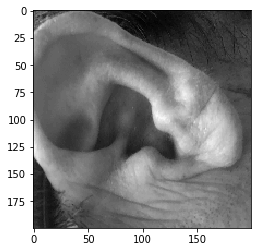

(200, 200)


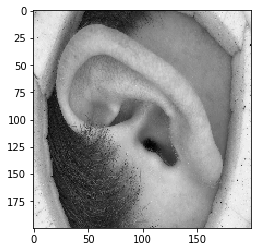

(200, 200)


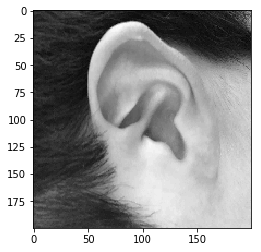

(200, 200)


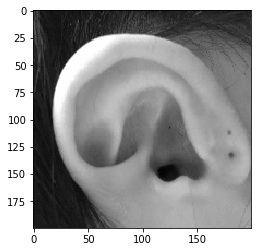

(200, 200)


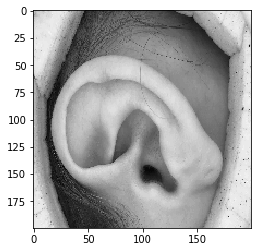

(200, 200)


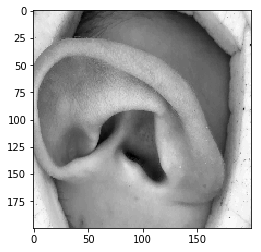

(200, 200)


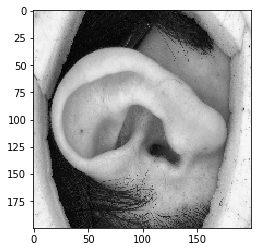

(200, 200)


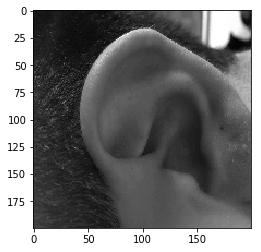

(200, 200)


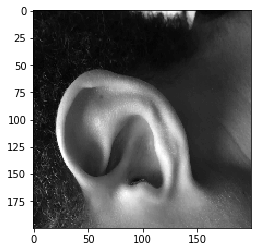

(200, 200)


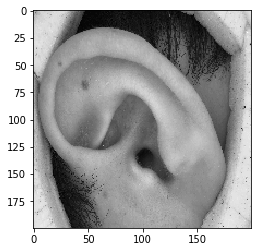

(200, 200)


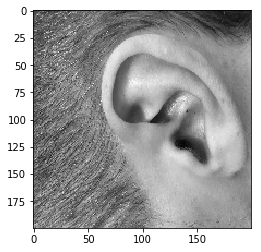

(200, 200)


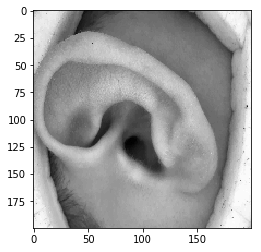

(200, 200)


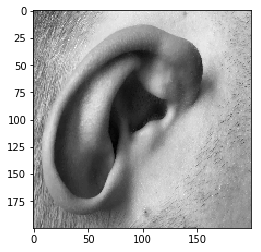

(200, 200)


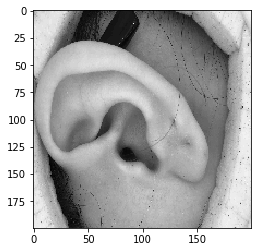

(200, 200)


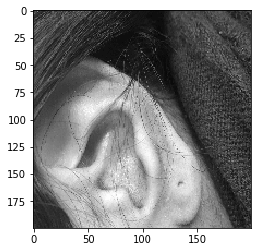

(200, 200)


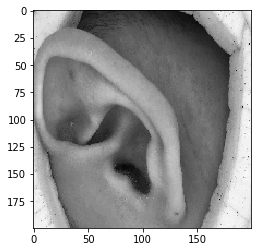

(200, 200)


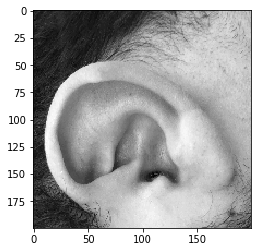

(200, 200)


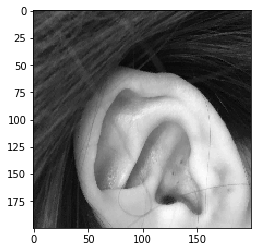

(200, 200)


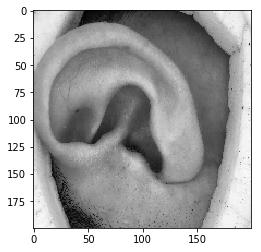

(200, 200)


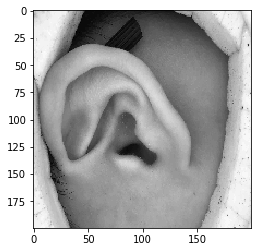

(200, 200)


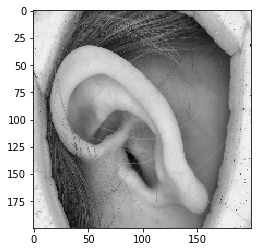

(200, 200)


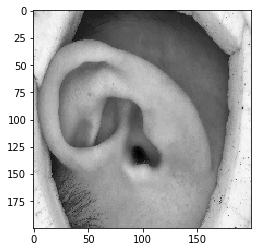

(200, 200)


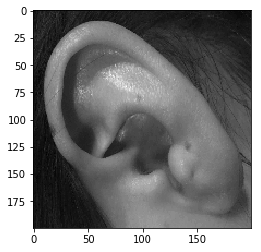

(200, 200)


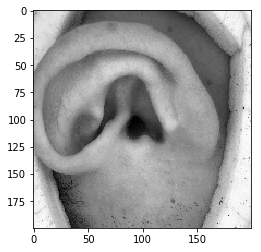

(200, 200)


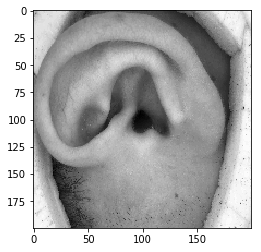

(200, 200)


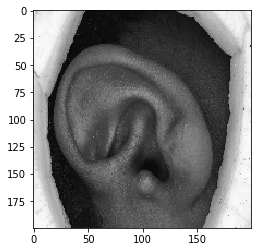

(200, 200)


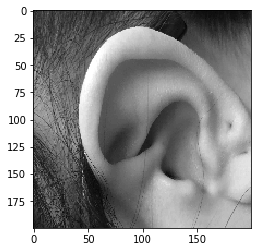

(200, 200)


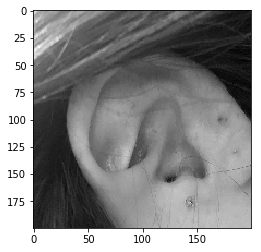

(200, 200)


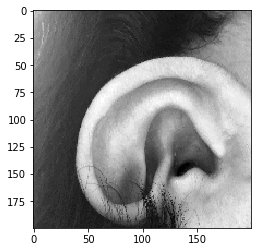

(200, 200)


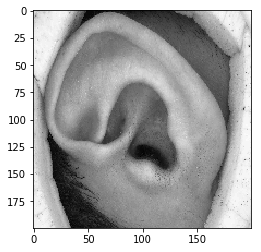

(200, 200)


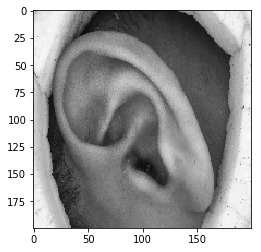

(200, 200)


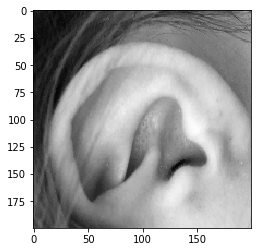

(200, 200)


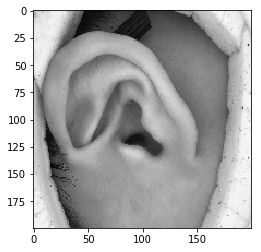

(200, 200)


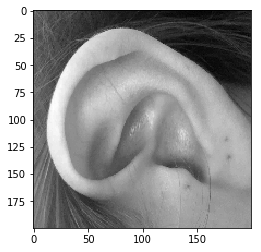

(200, 200)


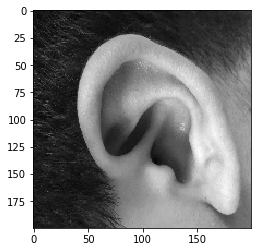

(200, 200)


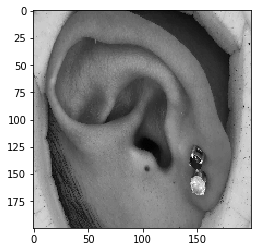

(200, 200)


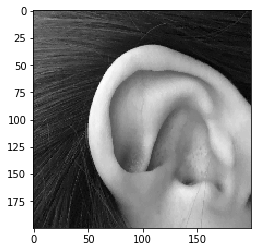

(200, 200)


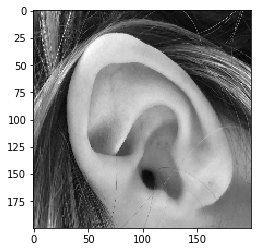

(200, 200)


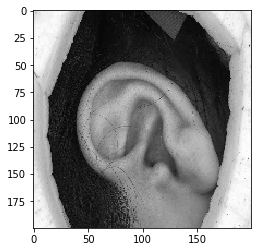

(200, 200)


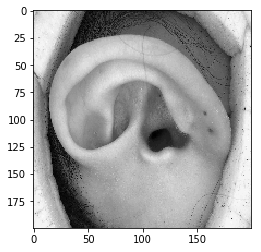

(200, 200)


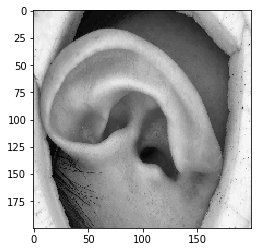

(200, 200)


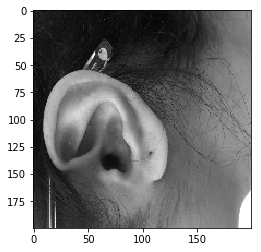

(200, 200)


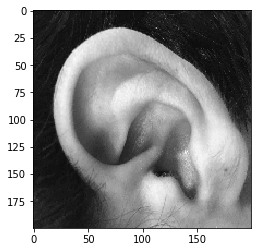

(200, 200)


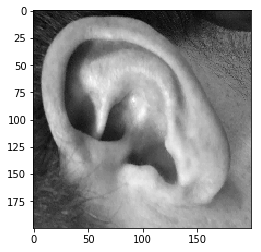

(200, 200)


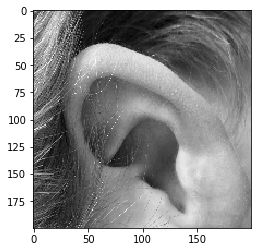

(200, 200)


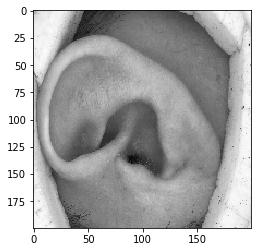

(200, 200)


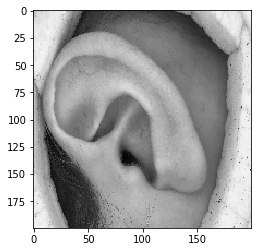

(200, 200)


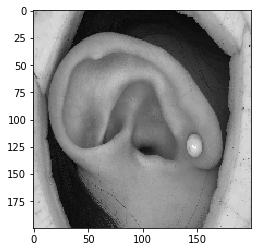

(200, 200)


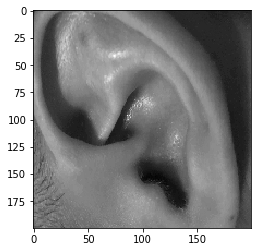

(200, 200)


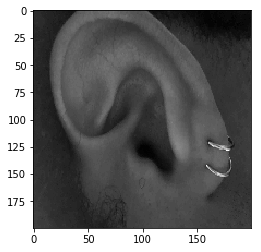

(200, 200)


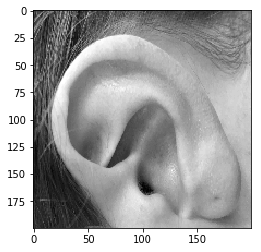

(200, 200)


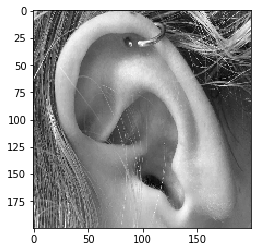

(200, 200)


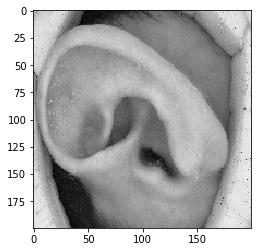

(200, 200)


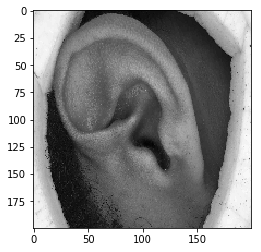

(200, 200)


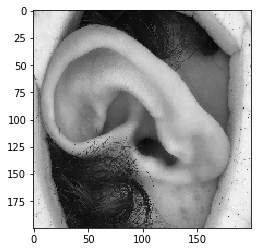

(200, 200)


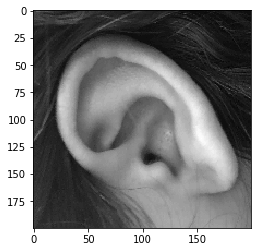

(200, 200)


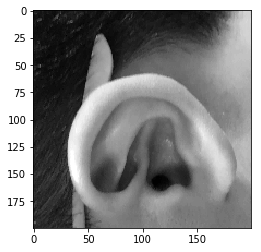

(200, 200)


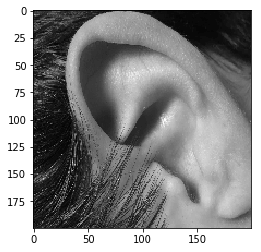

(200, 200)


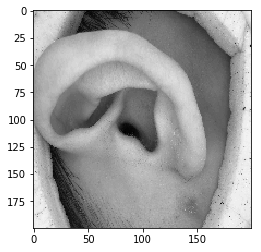

(200, 200)


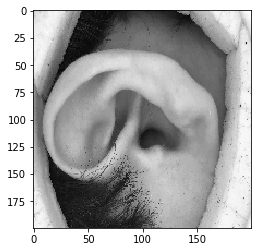

(200, 200)


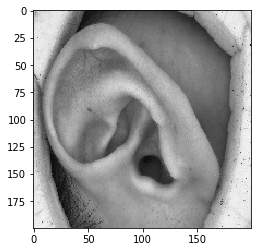

(200, 200)


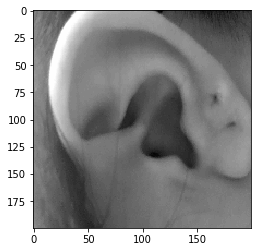

(200, 200)


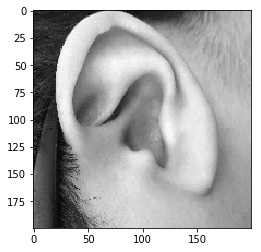

(200, 200)


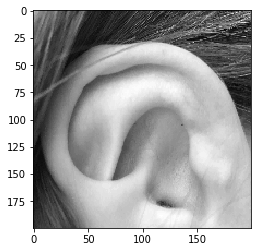

(200, 200)


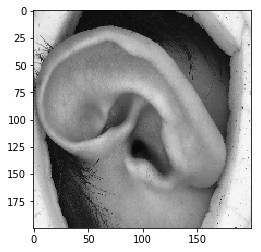

(200, 200)


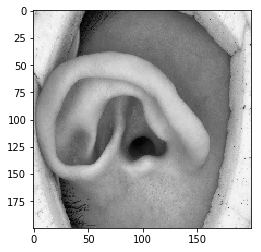

(200, 200)


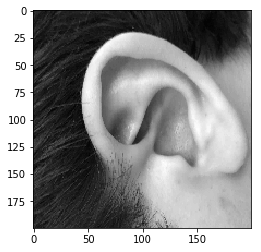

(200, 200)


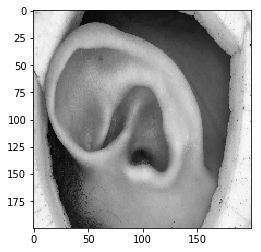

(200, 200)


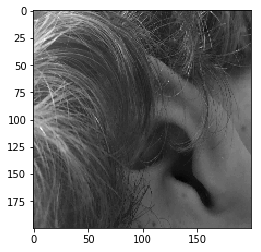

(200, 200)


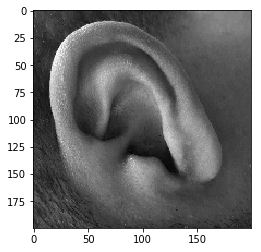

(200, 200)


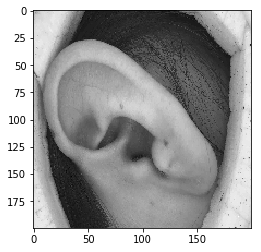

(200, 200)


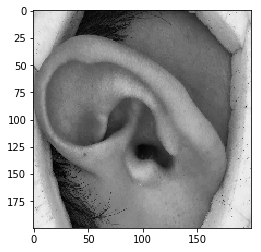

(200, 200)


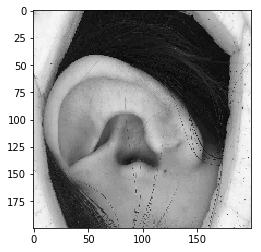

(200, 200)


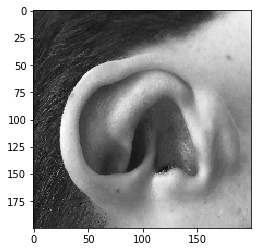

(200, 200)


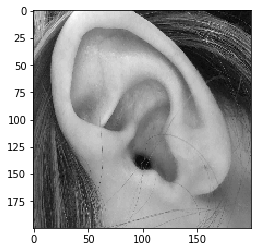

(200, 200)


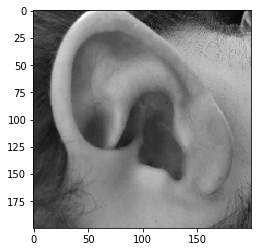

(200, 200)


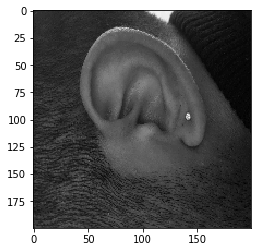

(200, 200)


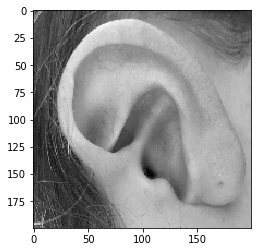

(200, 200)


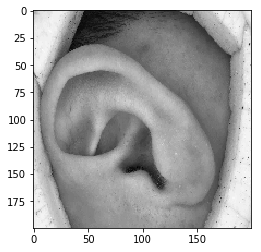

(200, 200)


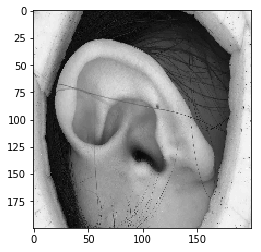

(200, 200)


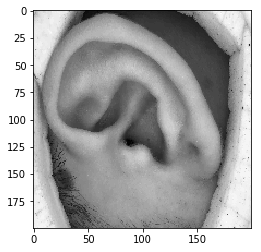

(200, 200)


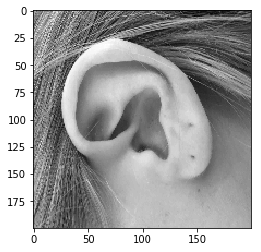

(200, 200)


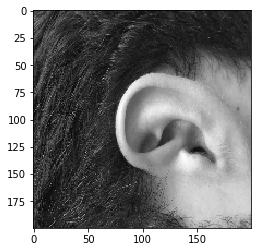

(200, 200)


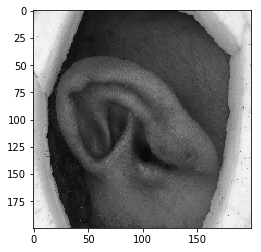

(200, 200)


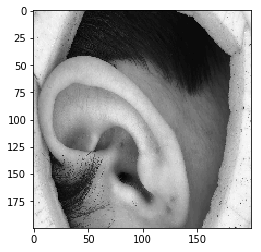

(200, 200)


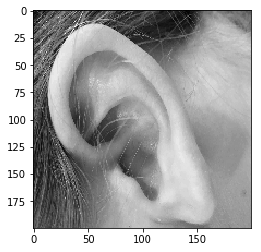

(200, 200)


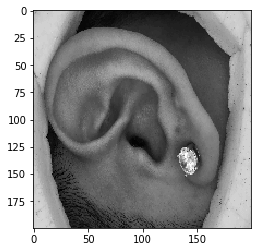

(200, 200)


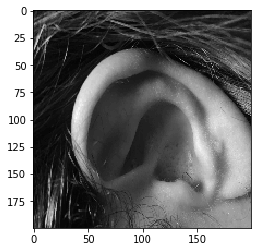

(200, 200)


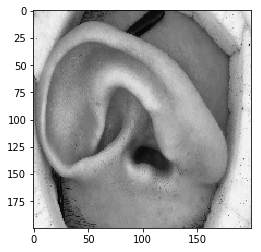

(200, 200)


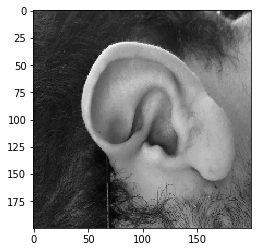

(200, 200)


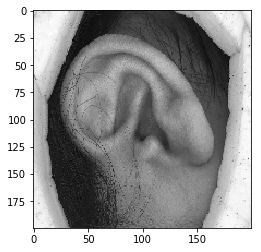

(200, 200)


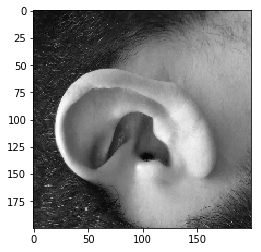

(200, 200)


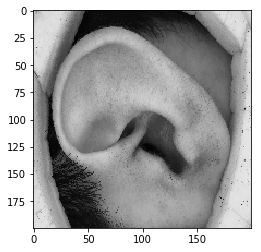

(200, 200)


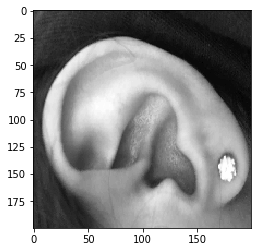

(200, 200)


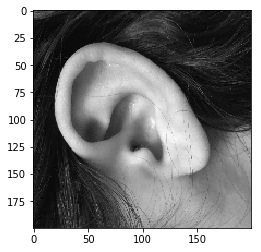

(200, 200)


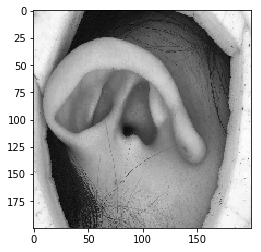

(200, 200)


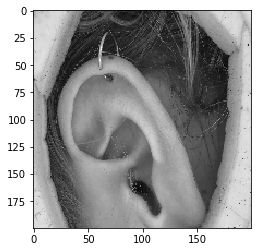

(200, 200)


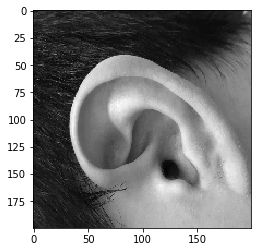

(200, 200)


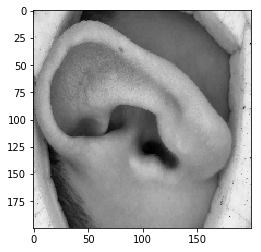

(200, 200)


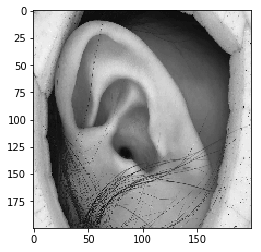

(200, 200)


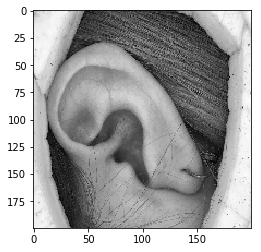

(200, 200)


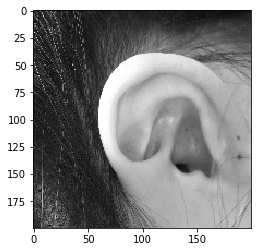

(200, 200)


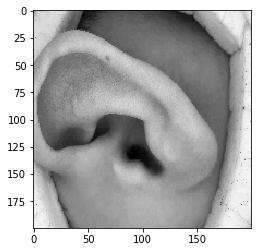

(200, 200)


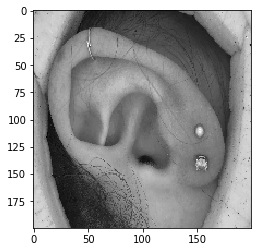

(200, 200)


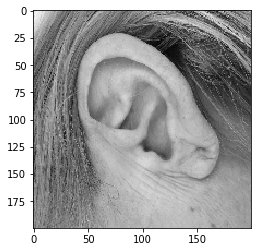

(200, 200)


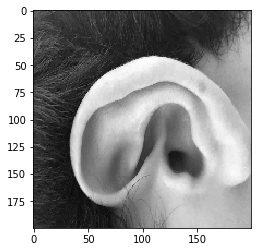

(200, 200)


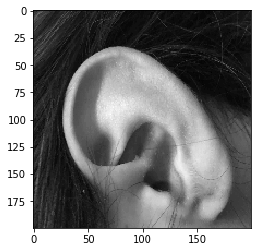

(200, 200)


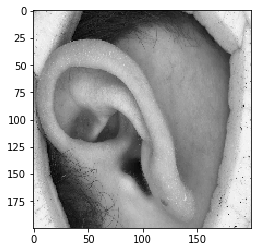

(200, 200)


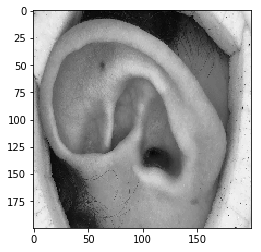

(200, 200)


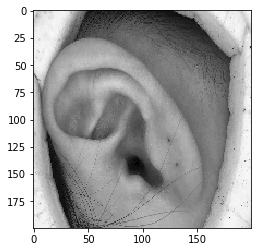

(200, 200)


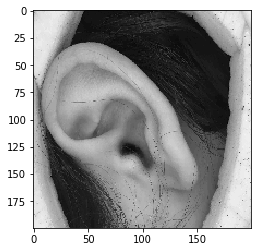

(200, 200)


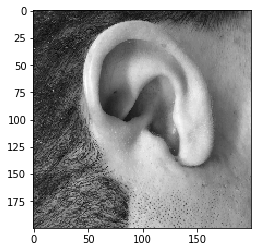

(200, 200)


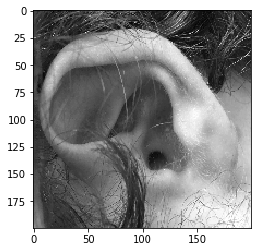

(200, 200)


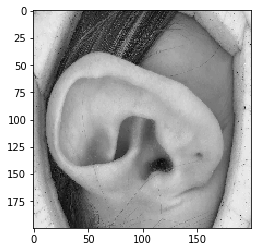

(200, 200)


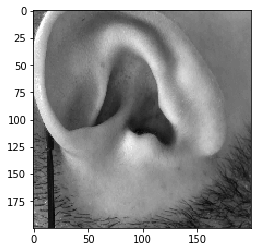

(200, 200)


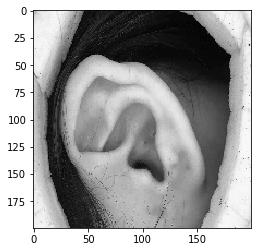

(200, 200)


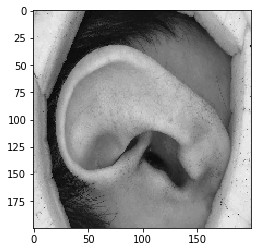

(200, 200)


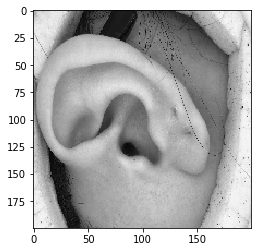

(200, 200)


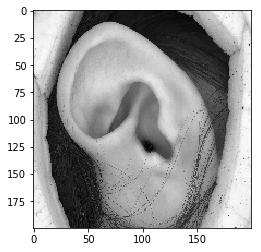

(200, 200)


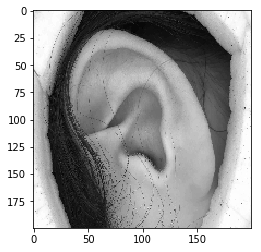

(200, 200)


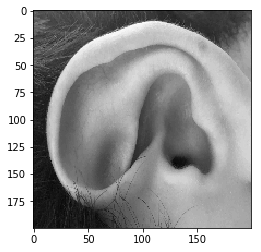

(200, 200)


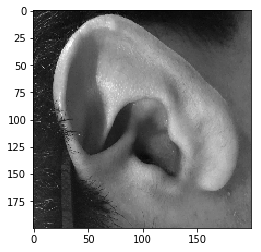

(200, 200)


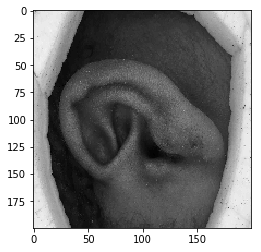

(200, 200)


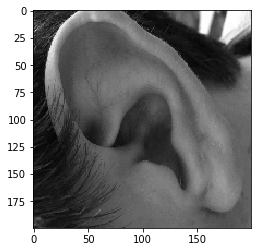

(200, 200)


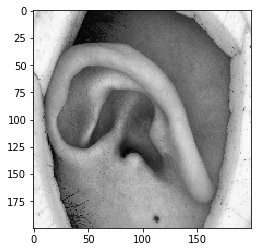

(200, 200)


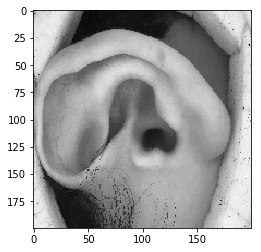

(200, 200)


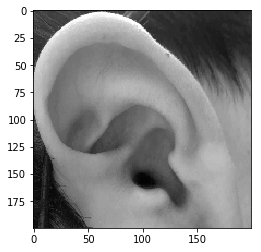

(200, 200)


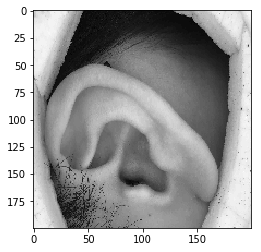

(200, 200)


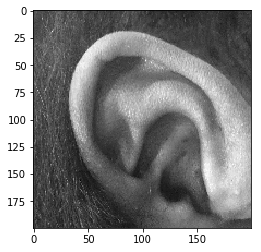

(200, 200)


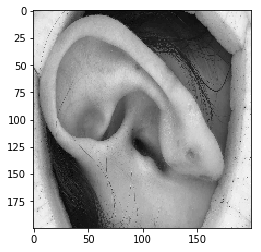

(200, 200)


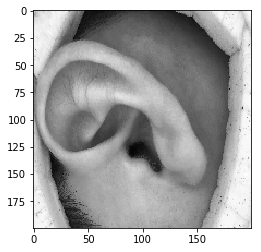

(200, 200)


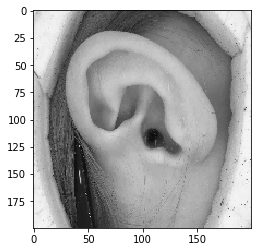

(200, 200)


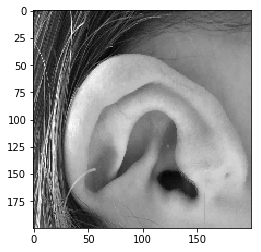

(200, 200)


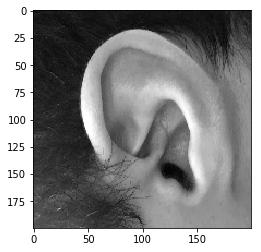

(200, 200)


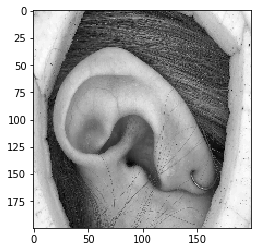

(200, 200)


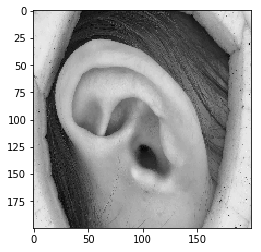

(200, 200)


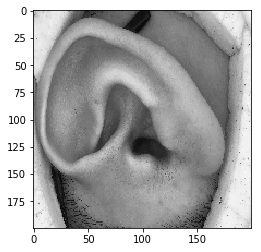

(200, 200)


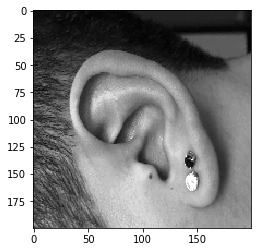

(200, 200)


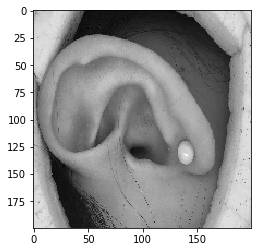

(200, 200)


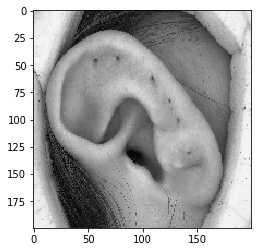

(200, 200)


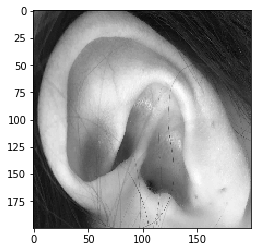

(200, 200)


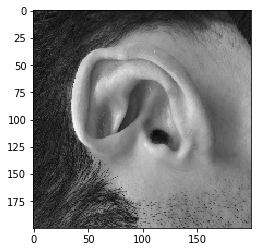

(200, 200)


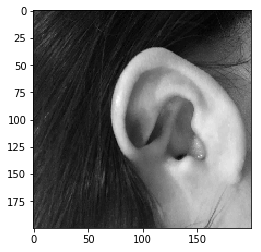

In [35]:
[(X_train, Y_train), (X_valid, Y_valid),(X_test, Y_test)] = data
for i in X_valid:
    print(i.shape)
    plt.imshow(i, cmap='gray')
    plt.show()

(200, 200)


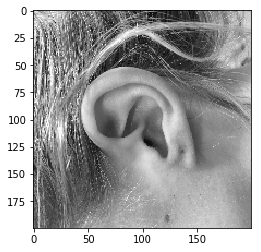

In [58]:


image = data_set[0]
print(image.shape)

# plt.imshow(image)
# plt.show()

plt.imshow(image, cmap='gray')
plt.show()

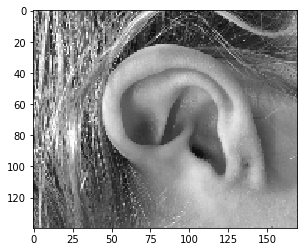

In [73]:
cropped_image = image[30:170, 0:170]
plt.imshow(cropped_image, cmap='gray')
plt.show()

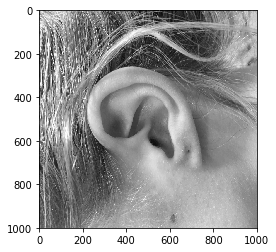

[[173 179 179 ... 181 183 183]
 [204 177 189 ... 176 184 184]
 [227 204 197 ... 172 171 171]
 ...
 [110  92 115 ... 135 143 140]
 [ 98  86 123 ... 135 139 144]
 [ 99  98 133 ... 135 134 149]]
(1000, 1000)


In [5]:
resized_image = cv2.resize(image, (1000,1000 ))
plt.imshow(resized_image, cmap='gray')
plt.show()
print(resized_image)
print(resized_image.shape)

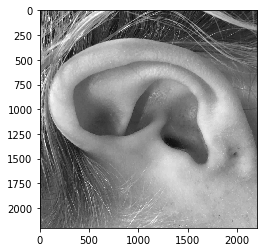

[[122 124 126 ...  87  87  87]
 [128 130 133 ...  84  84  84]
 [135 137 139 ...  81  81  81]
 ...
 [122 126 133 ... 188 188 188]
 [126 130 136 ... 188 188 188]
 [129 133 139 ... 188 188 188]]
(2200, 2200)


In [16]:
crop_img = image[500:2700,800:3000]
plt.imshow(crop_img, cmap='gray')
plt.show()
print(crop_img)
print(crop_img.shape)


In [17]:
for ear in train_x1:
    ear = cv2.cvtColor(ear,cv2.COLOR_RGB2GRAY)

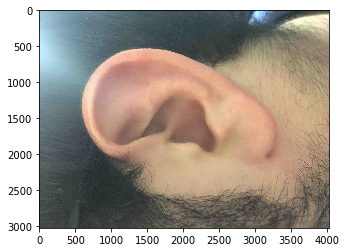

(3024, 4032, 3)


In [19]:
plt.imshow(train_x1[145],cmap = 'gray')
plt.show()
print(train_x1[145].shape)

In [5]:
def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

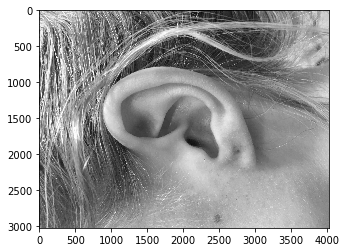

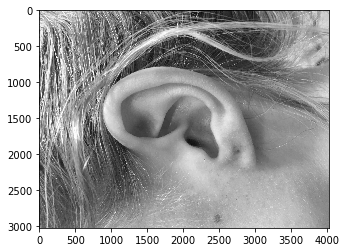

In [15]:
plt.imshow(data_set[0], cmap = 'gray')
plt.show()
image = adjust_gamma(data_set[0],1)
plt.imshow(image,cmap = 'gray')
plt.show()